# Notebook de simulation du data drift avec la librairie Evidently

**Objectif :** Tester l’utilisation de la librairie **Evidently** pour détecter du **Data Drift** en production. Pour ce faire, nous partons de l’hypothèse que le dataset “application_train” représente les données utilisées pour la modélisation, tandis que le dataset “application_test” correspond aux données des nouveaux clients une fois le modèle en production. L’analyse avec Evidently permettra de détecter d’éventuels Data Drifts sur les principales features entre les données d’entraînement et celles de production, en générant un tableau HTML d’analyse.

Le **Data Drift** (ou dérive des données) désigne un changement dans la distribution statistique des données d'entrée sur lesquelles un modèle de machine learning a été formé, par rapport aux données qu'il reçoit en production. En d'autres termes, c'est un phénomène qui se produit lorsque les caractéristiques des données que le modèle traite changent au fil du temps, ce qui peut affecter la performance et la précision du modèle.

### À quoi sert la détection du Data Drift ?

1. **Surveiller la performance du modèle :** Le Data Drift est souvent un indicateur que les données utilisées pour prédire ou classifier dans un environnement de production ne sont plus représentatives de celles sur lesquelles le modèle a été formé. Cela peut mener à une dégradation des performances du modèle.

2. **Assurer la qualité des prédictions :** En détectant le Data Drift, on peut réagir en ajustant ou en réentraînant le modèle pour qu'il s'adapte aux nouvelles caractéristiques des données. Cela permet de maintenir la qualité et la fiabilité des prédictions.

3. **Éviter les biais et erreurs :** Si le Data Drift n'est pas détecté, il peut entraîner des biais ou des erreurs dans les prédictions, ce qui pourrait avoir des conséquences néfastes, surtout dans des domaines critiques comme la finance ou la santé.

Le **Data Drift** est donc le changement des données utilisées par un modèle, et sa détection est cruciale pour s'assurer que le modèle reste précis et fiable lorsqu'il est utilisé sur de nouvelles données en production.

In [1]:
# Librairies de manipulation des données
import pandas as pd  
import re  

# Librairie de datasets Scikit-learn
from sklearn import datasets  # Accès à des datasets intégrés pour l'entraînement et le test des modèles

# Outils Evidently pour les rapports et les métriques
from evidently.report import Report  # Génération de rapports
from evidently.metric_preset import DataDriftPreset, TargetDriftPreset, DataQualityPreset, RegressionPreset
# Ensembles de métriques prédéfinis

# Outils Evidently pour les tests et l'analyse des données
from evidently.test_suite import TestSuite  # Création de suites de tests
from evidently.test_preset import DataStabilityTestPreset, DataQualityTestPreset  # Tests de stabilité et qualité des données

from evidently.metrics import *  # Importation de toutes les métriques
from evidently.metrics.base_metric import generate_column_metrics  # Génération de métriques par colonne

In [2]:
# Définition du chemin vers le fichier CSV
chemin_fichier = r'C:\Users\Infogene\Documents\Khoty_Privé\DOSSIER FORMATION DATA SCIENTIST\PROJET 7 ML\Application\Donnees_generees\Meilleures_Caracteristiques_Modele.csv'

# Chargement des 20 meilleures variables du modèle à partir du fichier CSV
Meilleures_Caracteristiques_Modele = pd.read_csv(chemin_fichier)['Variables'].tolist()

# Affichage pour vérifier
print(Meilleures_Caracteristiques_Modele)

['EXT_SOURCE_2', 'PAYMENT_RATE', 'AMT_ANNUITY', 'EXT_SOURCE_1', 'AMT_GOODS_PRICE', 'INSTAL_AMT_PAYMENT_SUM', 'DAYS_BIRTH', 'INSTAL_DPD_MEAN', 'INSTAL_AMT_PAYMENT_MEAN', 'CODE_GENDER', 'BURO_AMT_CREDIT_MAX_OVERDUE_MEAN', 'NAME_FAMILY_STATUS_Married', 'NAME_EDUCATION_TYPE_Highereducation', 'INSTAL_PAYMENT_PERC_MEAN', 'INSTAL_AMT_PAYMENT_MIN', 'ACTIVE_DAYS_CREDIT_ENDDATE_MAX', 'POS_MONTHS_BALANCE_SIZE', 'INSTAL_DAYS_ENTRY_PAYMENT_MEAN', 'DAYS_LAST_PHONE_CHANGE', 'ACTIVE_DAYS_CREDIT_ENDDATE_MEAN']


In [3]:
import pandas as pd
import re

# Définir le chemin d'accès aux fichiers CSV
chemin_anciens_clients = r'C:\Users\Infogene\Documents\Khoty_Privé\DOSSIER FORMATION DATA SCIENTIST\PROJET 7 ML\Application\Donnees_generees\AnciensClients.csv'

# Charger les données des anciens clients
AnciensClients = pd.read_csv(chemin_anciens_clients)

# Nettoyer les noms de colonnes pour enlever les caractères non alphanumériques
AnciensClients = AnciensClients.rename(columns=lambda x: re.sub('[^A-Za-z0-9_]+', '', x))

# Sélectionner les colonnes des meilleures caractéristiques
AnciensClients = AnciensClients[Meilleures_Caracteristiques_Modele]

# Afficher un échantillon des données pour vérification
AnciensClients.head()

,EXT_SOURCE_2,PAYMENT_RATE,AMT_ANNUITY,EXT_SOURCE_1,AMT_GOODS_PRICE,INSTAL_AMT_PAYMENT_SUM,DAYS_BIRTH,INSTAL_DPD_MEAN,INSTAL_AMT_PAYMENT_MEAN,CODE_GENDER,BURO_AMT_CREDIT_MAX_OVERDUE_MEAN,NAME_FAMILY_STATUS_Married,NAME_EDUCATION_TYPE_Highereducation,INSTAL_PAYMENT_PERC_MEAN,INSTAL_AMT_PAYMENT_MIN,ACTIVE_DAYS_CREDIT_ENDDATE_MAX,POS_MONTHS_BALANCE_SIZE,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,DAYS_LAST_PHONE_CHANGE,ACTIVE_DAYS_CREDIT_ENDDATE_MEAN
0,0.262949,0.060749,24700.5,0.083037,351000.0,219625.695,-9461.0,0.000000,11559.247105,0.0,1681.029,0.0,0.0,1.000000,9251.775,780.0,19.0,-315.421053,-1134.0,780.0
1,0.622246,0.027598,35698.5,0.311267,1129500.0,1618864.650,-16765.0,0.000000,64754.586000,1.0,0.000,1.0,1.0,1.000000,6662.970,1216.0,28.0,-1385.320000,-828.0,1216.0
2,0.555912,0.050000,6750.0,NaN,135000.0,21288.465,-19046.0,0.000000,7096.155000,0.0,0.000,0.0,0.0,1.000000,5357.250,NaN,4.0,-761.666667,-815.0,NaN
3,0.650442,0.094941,29686.5,NaN,297000.0,1007153.415,-19005.0,0.000000,62947.088438,1.0,NaN,0.0,0.0,1.000000,2482.920,NaN,21.0,-271.625000,-617.0,NaN
4,0.322738,0.042623,21865.5,NaN,513000.0,806127.975,-19932.0,0.954545,12214.060227,0.0,0.000,0.0,0.0,0.954545,0.180,NaN,66.0,-1032.242424,-1106.0,NaN


In [4]:
# Définir le chemin d'accès aux fichiers CSV
chemin_nouveaux_clients = r'C:\Users\Infogene\Documents\Khoty_Privé\DOSSIER FORMATION DATA SCIENTIST\PROJET 7 ML\Application\Donnees_generees\NouveauxClientsComplets.csv'

# Charger les données des nouveaux clients
NouveauxClients = pd.read_csv(chemin_nouveaux_clients)

# Nettoyer les noms de colonnes pour enlever les caractères non alphanumériques
NouveauxClients = NouveauxClients.rename(columns=lambda x: re.sub('[^A-Za-z0-9_]+', '', x))

# Sélectionner les colonnes des meilleures caractéristiques
NouveauxClients = NouveauxClients[Meilleures_Caracteristiques_Modele]
NouveauxClients.head()

,EXT_SOURCE_2,PAYMENT_RATE,AMT_ANNUITY,EXT_SOURCE_1,AMT_GOODS_PRICE,INSTAL_AMT_PAYMENT_SUM,DAYS_BIRTH,INSTAL_DPD_MEAN,INSTAL_AMT_PAYMENT_MEAN,CODE_GENDER,BURO_AMT_CREDIT_MAX_OVERDUE_MEAN,NAME_FAMILY_STATUS_Married,NAME_EDUCATION_TYPE_Highereducation,INSTAL_PAYMENT_PERC_MEAN,INSTAL_AMT_PAYMENT_MIN,ACTIVE_DAYS_CREDIT_ENDDATE_MAX,POS_MONTHS_BALANCE_SIZE,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,DAYS_LAST_PHONE_CHANGE,ACTIVE_DAYS_CREDIT_ENDDATE_MEAN
0,0.789654,0.036147,20560.5,0.752614,450000.0,41195.925,-19241.0,1.571429,5885.132143,1.0,NaN,1.0,1.0,1.000000,3951.000,1778.0,9.0,-2195.000000,-1740.0,1030.333333
1,0.291656,0.077973,17370.0,0.564990,180000.0,56161.845,-18064.0,0.111111,6240.205000,0.0,0.0,1.0,0.0,1.000000,4813.200,1324.0,11.0,-609.555556,0.0,723.000000
2,0.699787,0.105202,69777.0,NaN,630000.0,1509736.545,-20038.0,0.541935,9740.235774,0.0,19305.0,1.0,1.0,0.935484,6.165,NaN,36.0,-1358.109677,-856.0,NaN
3,0.509677,0.031123,49018.5,0.525734,1575000.0,492310.665,-13976.0,0.265487,4356.731549,1.0,0.0,1.0,0.0,0.911504,1.170,30885.0,31.0,-858.548673,-1805.0,7872.750000
4,0.425687,0.051266,32067.0,0.202145,625500.0,133204.050,-13040.0,0.000000,11100.337500,0.0,NaN,1.0,0.0,1.000000,11097.450,NaN,13.0,-634.250000,-821.0,NaN


In [5]:
from evidently.test_suite import TestSuite
from evidently.test_preset import DataStabilityTestPreset

# Créer une suite de tests pour la stabilité des données
data_stability = TestSuite(tests=[DataStabilityTestPreset()])

# Exécuter la suite de tests en utilisant les données des nouveaux et anciens clients
data_stability.run(current_data=NouveauxClients, reference_data=AnciensClients, column_mapping=None)

# Afficher les résultats des tests en mode inline (utilisé pour Jupyter Notebook)
data_stability.show(mode='inline')

In [6]:
from evidently.report import Report
from evidently.metric_preset import DataDriftPreset

# Créer un rapport pour la dérive des données (Data Drift)
data_drift_report = Report(metrics=[DataDriftPreset()])

# Exécuter le rapport en utilisant les données des nouveaux et anciens clients
data_drift_report.run(current_data=NouveauxClients, reference_data=AnciensClients, column_mapping=None)

# Afficher les résultats du rapport en mode inline (utilisé pour Jupyter Notebook)
data_drift_report.show(mode='inline')

In [7]:
# Exporter les résultats de la stabilité des données sous forme de fichier HTML
data_stability.save_html("stabilite_donnees.html")

# Exporter les résultats du rapport de dérive des données sous forme de fichier HTML
data_drift_report.save_html("rapport_derive_donnees.html")

## Approfondir les analyses, bien que non exigé dans le projet, est essentiel pour satisfaire notre curiosité.

### Calculer la Dérive des Données 

Nous utilisons la divergence de **Kullback-Leibler (KL Divergence)** pour mesurer à quel point une distribution de probabilité s'écarte d'une autre. C'est une méthode courante pour détecter les dérives dans les données.

In [8]:
import numpy as np
from scipy.stats import entropy

# Fonction pour calculer la divergence KL entre deux distributions
def kl_divergence(p, q):
    p = np.array(p) + 1e-10  # Ajouter une petite valeur pour éviter les divisions par zéro
    q = np.array(q) + 1e-10
    return entropy(p, q)

# Liste pour stocker les résultats de dérive
drift_scores = []

# Calculer la dérive pour chaque variable importante
for variable in Meilleures_Caracteristiques_Modele:
    # Filtrer les valeurs NaN des anciens et nouveaux clients
    anciens_sans_nan = AnciensClients[variable].dropna()
    nouveaux_sans_nan = NouveauxClients[variable].dropna()

    if anciens_sans_nan.empty or nouveaux_sans_nan.empty:
        print(f"La variable {variable} a trop de valeurs manquantes et est ignorée.")
        continue

    # Calculer la densité des distributions des anciens et nouveaux clients
    ancienne_distribution, _ = np.histogram(anciens_sans_nan, bins=50, density=True)
    nouvelle_distribution, _ = np.histogram(nouveaux_sans_nan, bins=50, density=True)
    
    # Calculer la dérive entre les deux distributions
    kl_score = kl_divergence(ancienne_distribution, nouvelle_distribution)
    drift_scores.append((variable, kl_score))

# Trier les variables par score de dérive décroissant
drift_scores.sort(key=lambda x: x[1], reverse=True)

# Afficher les 5 variables avec la plus grande dérive
for variable, score in drift_scores[:5]:
    print(f'Variable: {variable}, Dérive (KL Divergence): {score}')

Variable: ACTIVE_DAYS_CREDIT_ENDDATE_MAX, Dérive (KL Divergence): 12.364910855081657
Variable: ACTIVE_DAYS_CREDIT_ENDDATE_MEAN, Dérive (KL Divergence): 5.226183740085715
Variable: PAYMENT_RATE, Dérive (KL Divergence): 1.5429212635423675
Variable: AMT_GOODS_PRICE, Dérive (KL Divergence): 0.5807470770619405
Variable: AMT_ANNUITY, Dérive (KL Divergence): 0.2512999758392019


### Visualisation des Variables avec la Plus Grande Dérive

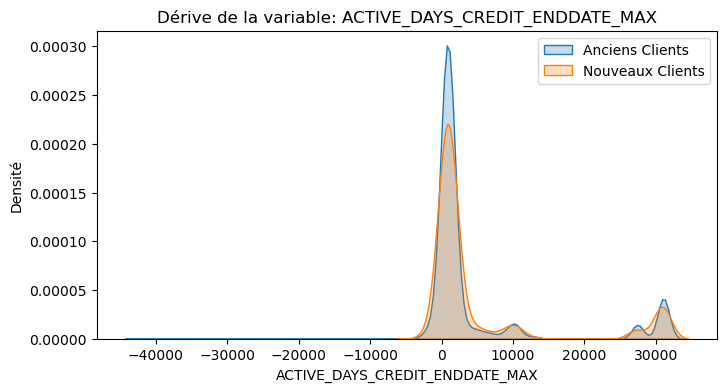

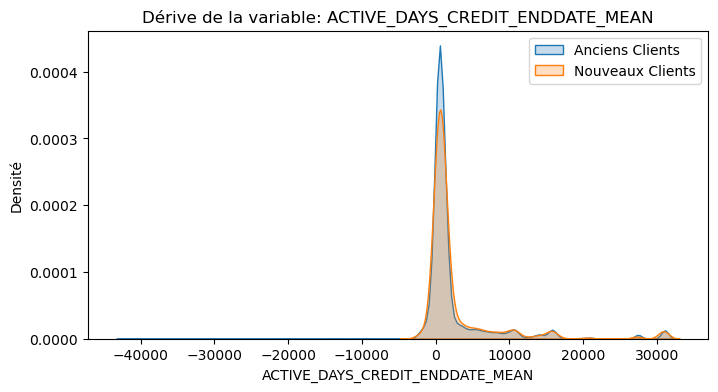

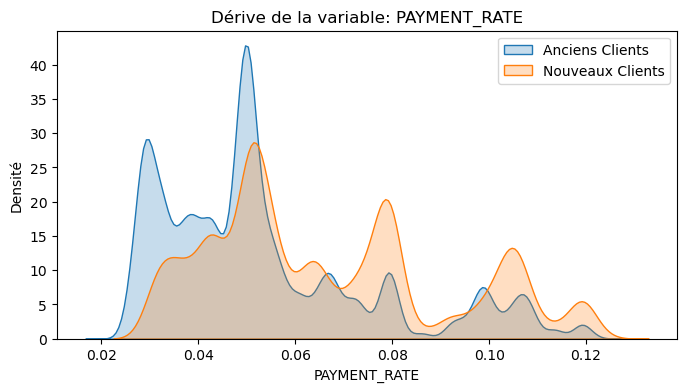

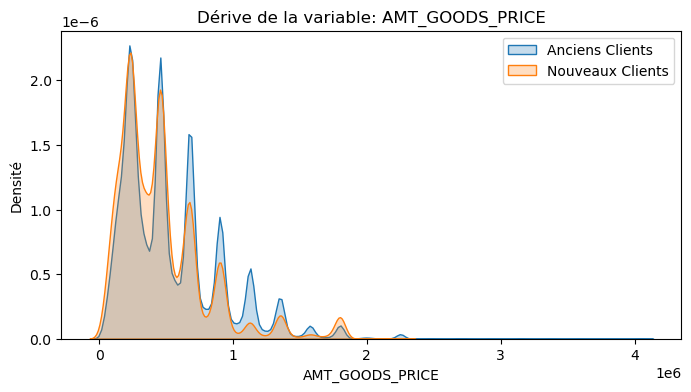

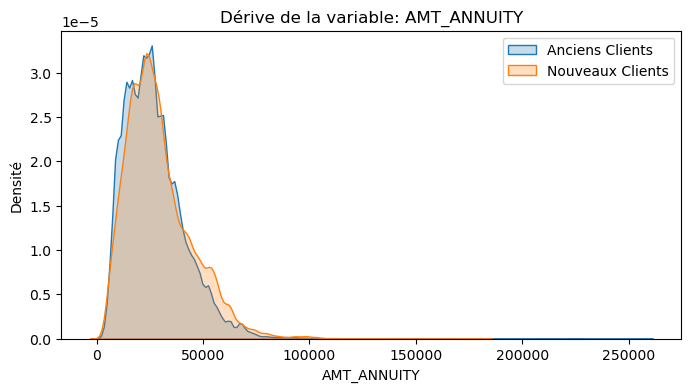

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

for variable, _ in drift_scores[:5]:
    plt.figure(figsize=(8, 4))
    sns.kdeplot(AnciensClients[variable], label='Anciens Clients', shade=True)
    sns.kdeplot(NouveauxClients[variable], label='Nouveaux Clients', shade=True)
    plt.title(f'Dérive de la variable: {variable}')
    plt.xlabel(variable)
    plt.ylabel('Densité')
    plt.legend()
    plt.show()

### Visualisons les Dérives

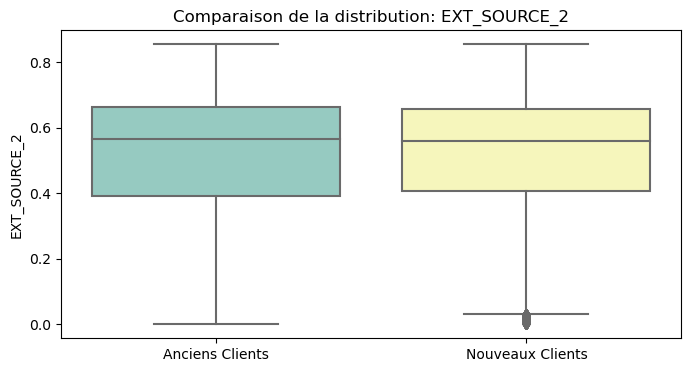

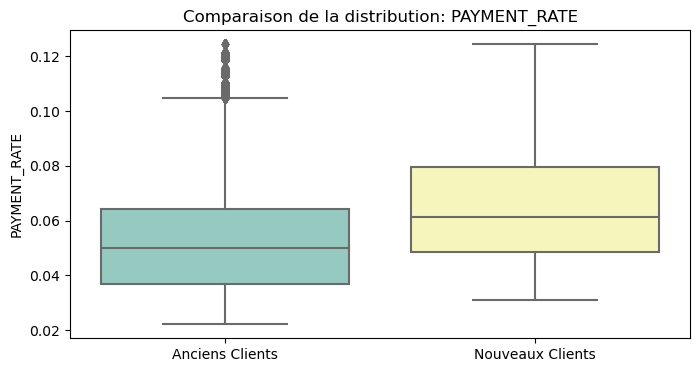

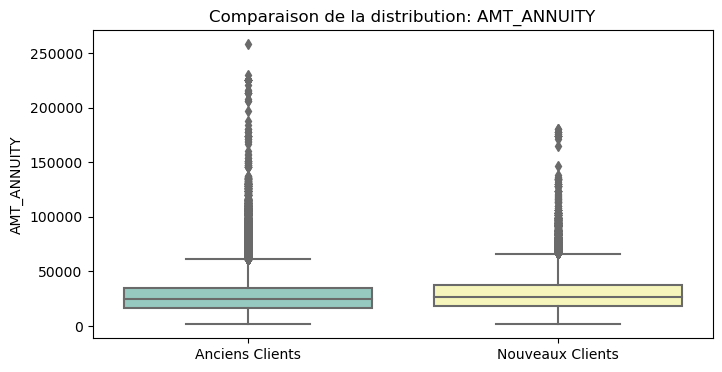

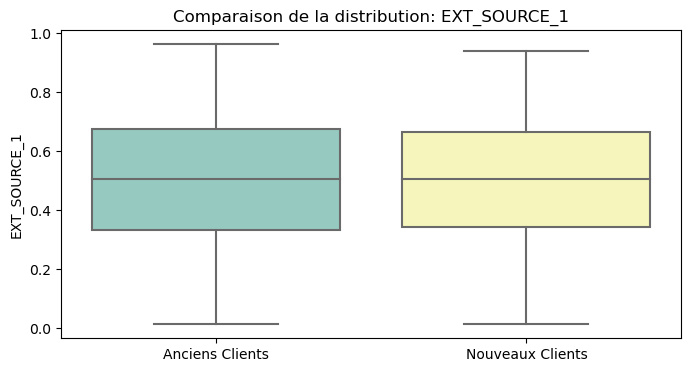

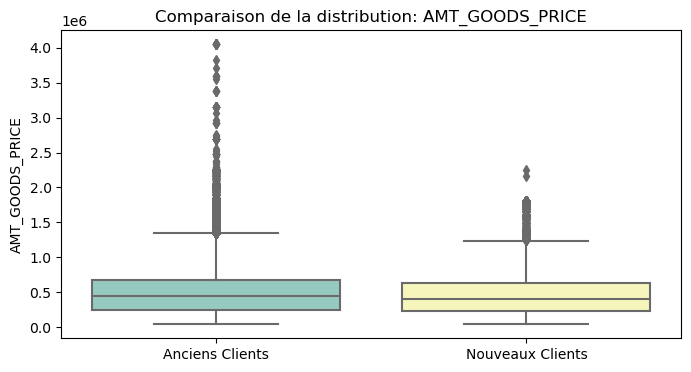

...

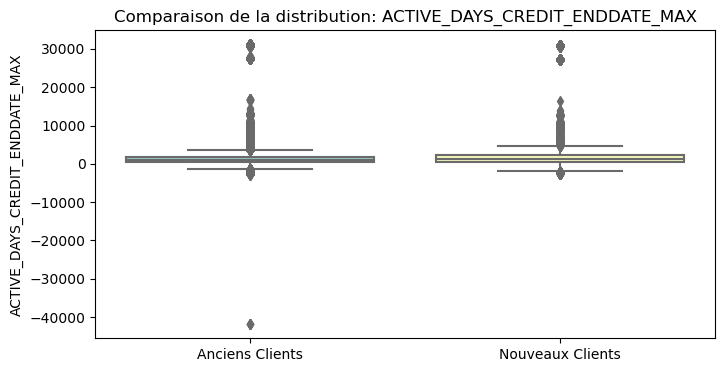

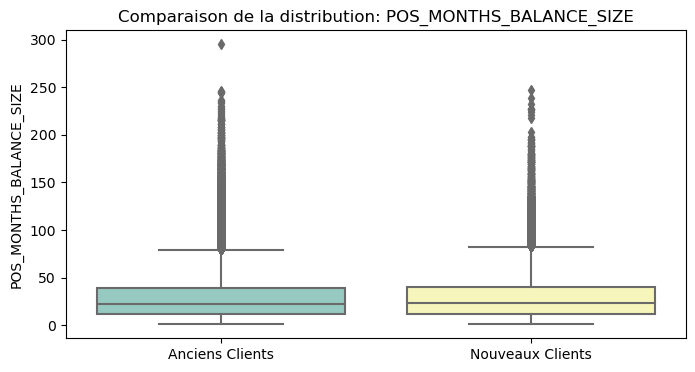

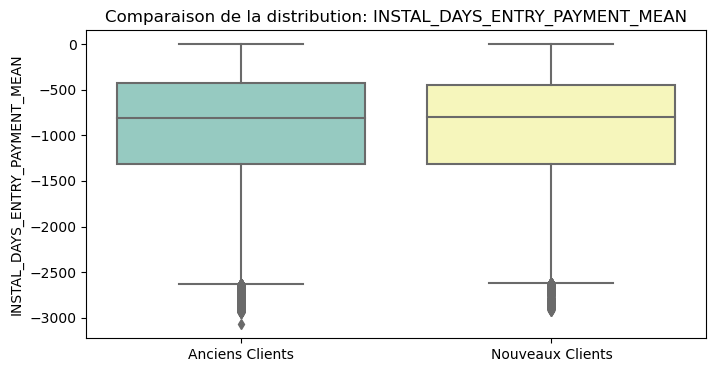

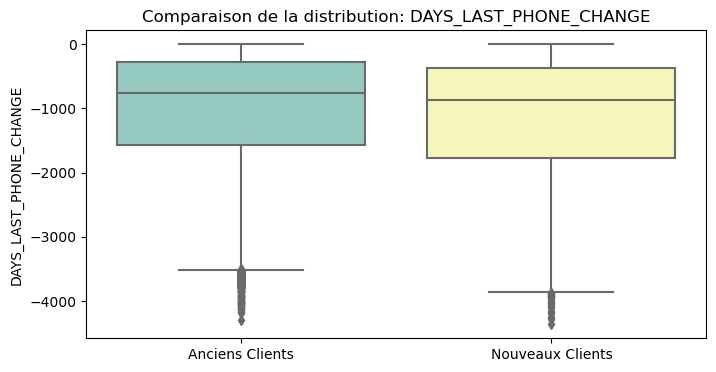

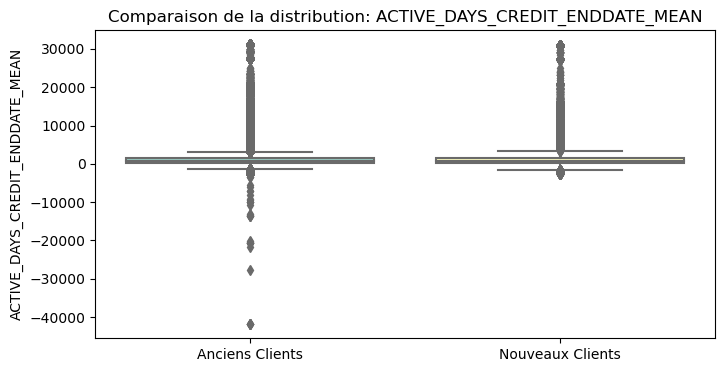

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

# Variables les plus importantes (déjà sélectionnées précédemment)
variables_importantes = Meilleures_Caracteristiques_Modele

# Visualisation des dérives pour chaque variable importante
for variable in variables_importantes:
    plt.figure(figsize=(8, 4))
    sns.boxplot(data=[AnciensClients[variable], NouveauxClients[variable]], palette="Set3")
    plt.xticks([0, 1], ['Anciens Clients', 'Nouveaux Clients'])
    plt.title(f'Comparaison de la distribution: {variable}')
    plt.ylabel(variable)
    plt.show()

### Analyse de la qualité des données

**Vérification des Données Manquantes et Anormales**

In [13]:
# Vérification des données manquantes pour les anciens clients
missing_values_anciens = AnciensClients.isnull().sum()
missing_values_anciens = missing_values_anciens[missing_values_anciens > 0]
print("Valeurs manquantes chez les Anciens Clients:")
print(missing_values_anciens)

# Vérification des données manquantes pour les nouveaux clients
missing_values_nouveaux = NouveauxClients.isnull().sum()
missing_values_nouveaux = missing_values_nouveaux[missing_values_nouveaux > 0]
print("\nValeurs manquantes chez les Nouveaux Clients:")
print(missing_values_nouveaux)

Valeurs manquantes chez les Anciens Clients:
EXT_SOURCE_2                           660
PAYMENT_RATE                            12
AMT_ANNUITY                             12
EXT_SOURCE_1                        173376
AMT_GOODS_PRICE                        278
INSTAL_AMT_PAYMENT_SUM               15868
INSTAL_DPD_MEAN                      15868
INSTAL_AMT_PAYMENT_MEAN              15876
BURO_AMT_CREDIT_MAX_OVERDUE_MEAN    123624
INSTAL_PAYMENT_PERC_MEAN             15894
INSTAL_AMT_PAYMENT_MIN               15876
ACTIVE_DAYS_CREDIT_ENDDATE_MAX       99324
POS_MONTHS_BALANCE_SIZE              18067
INSTAL_DAYS_ENTRY_PAYMENT_MEAN       15876
DAYS_LAST_PHONE_CHANGE                   1
ACTIVE_DAYS_CREDIT_ENDDATE_MEAN      99324
dtype: int64

Valeurs manquantes chez les Nouveaux Clients:
EXT_SOURCE_2                            8
PAYMENT_RATE                           24
AMT_ANNUITY                            24
EXT_SOURCE_1                        20532
INSTAL_AMT_PAYMENT_SUM                8

#### Identification des Valeurs Aberrantes

Pour identifier les valeurs aberrantes, nous allons utiliser une approche basée sur l'écart interquartile (IQR). Les valeurs en dehors de 1,5 fois l'IQR au-dessus du troisième quartile ou en dessous du premier quartile seront considérées comme des valeurs aberrantes.

In [14]:
def detect_outliers_iqr(df):
    outliers = {}
    for column in df.columns:
        if df[column].dtype in ['int64', 'float64']:
            Q1 = df[column].quantile(0.25)
            Q3 = df[column].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            outliers[column] = ((df[column] < lower_bound) | (df[column] > upper_bound)).sum()
    return outliers

# Détection des valeurs aberrantes chez les anciens clients
outliers_anciens = detect_outliers_iqr(AnciensClients)
print("\nValeurs aberrantes chez les Anciens Clients:")
print(outliers_anciens)

# Détection des valeurs aberrantes chez les nouveaux clients
outliers_nouveaux = detect_outliers_iqr(NouveauxClients)
print("\nValeurs aberrantes chez les Nouveaux Clients:")
print(outliers_nouveaux)


Valeurs aberrantes chez les Anciens Clients:
{'EXT_SOURCE_2': 0, 'PAYMENT_RATE': 15933, 'AMT_ANNUITY': 7504, 'EXT_SOURCE_1': 0, 'AMT_GOODS_PRICE': 14728, 'INSTAL_AMT_PAYMENT_SUM': 26981, 'DAYS_BIRTH': 0, 'INSTAL_DPD_MEAN': 39286, 'INSTAL_AMT_PAYMENT_MEAN': 24081, 'CODE_GENDER': 0, 'BURO_AMT_CREDIT_MAX_OVERDUE_MEAN': 25422, 'NAME_FAMILY_STATUS_Married': 0, 'NAME_EDUCATION_TYPE_Highereducation': 74862, 'INSTAL_PAYMENT_PERC_MEAN': 62850, 'INSTAL_AMT_PAYMENT_MIN': 15683, 'ACTIVE_DAYS_CREDIT_ENDDATE_MAX': 43593, 'POS_MONTHS_BALANCE_SIZE': 14120, 'INSTAL_DAYS_ENTRY_PAYMENT_MEAN': 2488, 'DAYS_LAST_PHONE_CHANGE': 435, 'ACTIVE_DAYS_CREDIT_ENDDATE_MEAN': 37715}

Valeurs aberrantes chez les Nouveaux Clients:
{'EXT_SOURCE_2': 412, 'PAYMENT_RATE': 0, 'AMT_ANNUITY': 1173, 'EXT_SOURCE_1': 0, 'AMT_GOODS_PRICE': 2122, 'INSTAL_AMT_PAYMENT_SUM': 4249, 'DAYS_BIRTH': 0, 'INSTAL_DPD_MEAN': 6268, 'INSTAL_AMT_PAYMENT_MEAN': 3865, 'CODE_GENDER': 0, 'BURO_AMT_CREDIT_MAX_OVERDUE_MEAN': 4789, 'NAME_FAMILY_STATUS

### Génération du Rapport de Qualité des Données

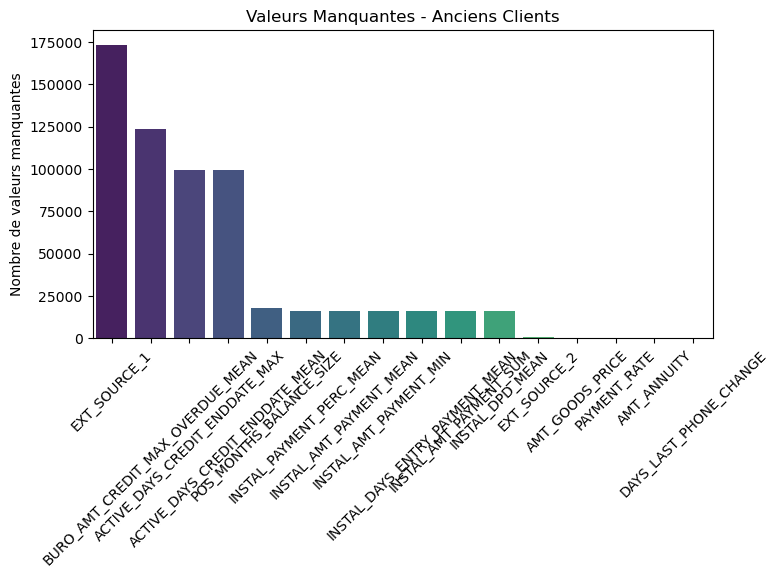

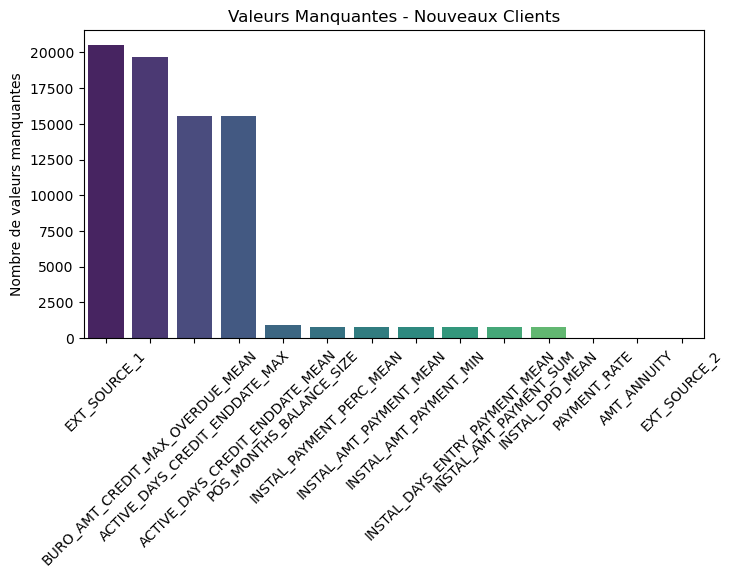

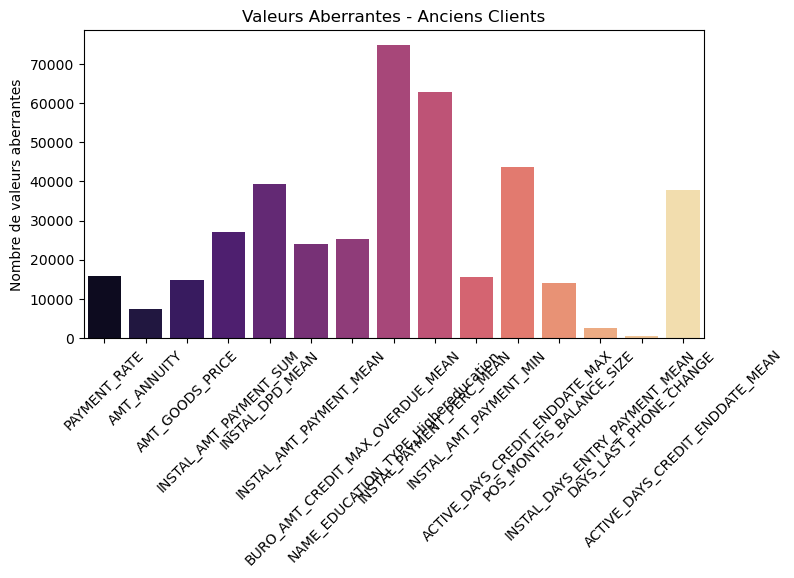

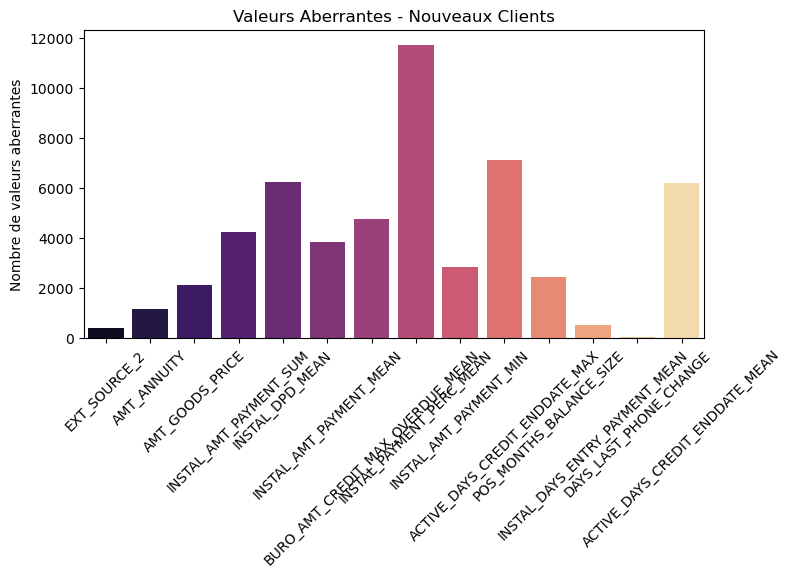

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

# Visualisation des valeurs manquantes
def plot_missing_values(df, title):
    missing = df.isnull().sum()
    missing = missing[missing > 0].sort_values(ascending=False)
    plt.figure(figsize=(8, 4))
    sns.barplot(x=missing.index, y=missing.values, palette="viridis")
    plt.title(f'Valeurs Manquantes - {title}')
    plt.xticks(rotation=45)
    plt.ylabel('Nombre de valeurs manquantes')
    plt.show()

plot_missing_values(AnciensClients, "Anciens Clients")
plot_missing_values(NouveauxClients, "Nouveaux Clients")

# Visualisation des valeurs aberrantes
def plot_outliers(outliers, title):
    outliers = {k: v for k, v in outliers.items() if v > 0}
    plt.figure(figsize=(8, 4))
    sns.barplot(x=list(outliers.keys()), y=list(outliers.values()), palette="magma")
    plt.title(f'Valeurs Aberrantes - {title}')
    plt.xticks(rotation=45)
    plt.ylabel('Nombre de valeurs aberrantes')
    plt.show()

plot_outliers(outliers_anciens, "Anciens Clients")
plot_outliers(outliers_nouveaux, "Nouveaux Clients")